## Importing Libraries

In [1]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import numpy as np
import PIL
import torchvision
import matplotlib.pyplot as plt

## Q1 : Getting the labelled face dataset from specified source

In [2]:
%%bash

if [ ! -d "lfw" ]; then
    wget http://vis-www.cs.umass.edu/lfw/lfw.tgz
    tar -xzf lfw.tgz
    rm lfw.tgz
fi

## Q2 : Getting the names of people with more than one image and also the number

In [3]:
import os

# list to hold people with more than one image
people_with_more_than_one_image = []

# Define the root directory
root_directory = "./lfw"

# Create a dictionary to store subfolder file counts
subfolder_counts = {}

# Walk through the directory and count files in subfolders
for dirpath, _, filenames in os.walk(root_directory):
    subfolder_name = os.path.basename(dirpath)
    if(subfolder_name in subfolder_counts.keys()):
      subfolder_counts[subfolder_name] += len(filenames)
    else:
      subfolder_counts[subfolder_name] = len(filenames)

# Get subfolders with more than one file
people_with_more_than_one_image = [folder for folder, count in subfolder_counts.items() if count > 1]

In [4]:
print(len(people_with_more_than_one_image))
print(people_with_more_than_one_image[:30])

1680
['Magui_Serna', 'Patricia_Clarkson', 'Hipolito_Mejia', 'Petro_Symonenko', 'Chang_Dae-whan', 'Sheila_Fraser', 'Tiger_Woods', 'David_Hyde_Pierce', 'Ai_Sugiyama', 'Emma_Thompson', 'William_Martin', 'Mark_Gottfried', 'Warren_Buffett', 'Lenny_Wilkens', 'Pedro_Solbes', 'Kemal_Dervis', 'Tim_Chapman', 'Marty_Mornhinweg', 'Hun_Sen', 'Jacques_Chirac', 'Faye_Dunaway', 'Bob_Geldof', 'Frank_Lautenberg', 'Gene_Robinson', 'Sepp_Blatter', 'Garry_Trudeau', 'Hermann_Maier', 'Kenneth_Bowersox', 'Vladimir_Spidla', 'George_P_Bush']


Thus we see that there are 1680 people in the dataset who have more than one image, and the first 30 of their names are printed below

# Part A

## Q3 : Splitting into Test, Train and Validation by Person

### We initially split the dataset into 70% train and 15% test and 15% validation

In [5]:
import numpy as np
import random

# shuffle the names
random.shuffle(people_with_more_than_one_image)

# Defining the proportions for train, validation, and test sets
# for now assuming
train_ratio = 0.7
validation_ratio = 0.15
test_ratio = 0.15

# Calculate the sizes for each set
total_samples = len(people_with_more_than_one_image)
train_size = int(train_ratio * total_samples)
validation_size = int(validation_ratio * total_samples)
test_size = total_samples - train_size - validation_size

# Use NumPy to split the data
train_data_names = people_with_more_than_one_image[:train_size]
validation_data_names = people_with_more_than_one_image[train_size:train_size + validation_size]
test_data_names = people_with_more_than_one_image[train_size + validation_size:]

# Now you have your data split into train, validation, and test sets
print("Number of People in Train Data:", len(train_data_names))
print("Number of People in Validation Data:", len(validation_data_names))
print("Number of People in Test Data:", len(test_data_names))

Number of People in Train Data: 1176
Number of People in Validation Data: 252
Number of People in Test Data: 252


In [6]:
class SiameseNetworkDataset(Dataset):

    def __init__(self, personNames, dataset_size, transform=None, should_invert = False):
        self.personNames = personNames
        self.transform = transform
        self.should_invert = should_invert
        self.dataset_size = dataset_size

    def __getitem__(self,index):
        person1 = random.choice(self.personNames)
        person2 = random.choice(self.personNames)

        while person1 == person2:
          person2 = random.choice(self.personNames)

        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
           img0_name = random.choice(os.listdir(root_directory + f'/{person1}'))
           img1_name = random.choice(os.listdir(root_directory + f'/{person1}'))
           person2 = person1
        else:
            img0_name = random.choice(os.listdir(root_directory + f'/{person1}'))
            img1_name = random.choice(os.listdir(root_directory + f'/{person2}'))

        img0 = PIL.Image.open(root_directory + f'/{person1}' + f'/{img0_name}')
        img1 = PIL.Image.open(root_directory + f'/{person2}' + f'/{img1_name}')
        img0 = img0.convert("RGB")
        img1 = img1.convert("RGB")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        if person1 == person2:
          label = 1.0
        else:
          label = -1.0

        return img0, img1 , torch.from_numpy(np.array(label,dtype=np.float32))

    def __len__(self):
        return self.dataset_size

### Let us visualize the working of the Custom Dataset created to train our Siaamese Network

In [7]:
visualize_dataset = SiameseNetworkDataset(personNames = train_data_names, dataset_size = 1000, transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()]))

In [8]:
visualize_dataloader = DataLoader(visualize_dataset, shuffle=True, batch_size=8)

Batch : 0
[-1.  1. -1.  1. -1. -1. -1.  1.]


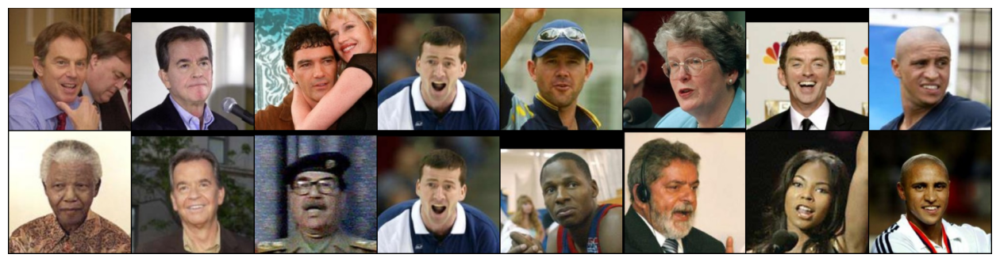

Batch : 1
[ 1. -1. -1.  1.  1. -1.  1. -1.]


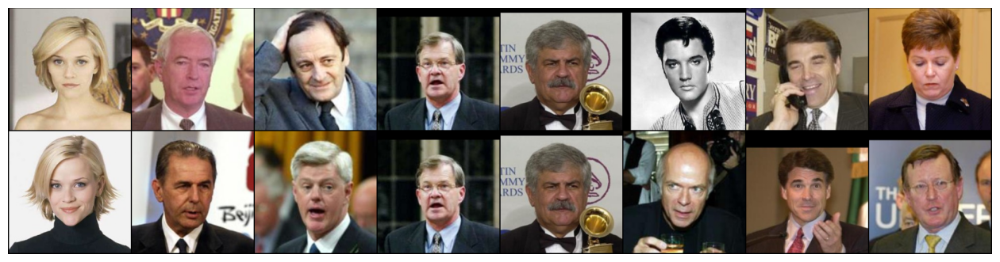

Batch : 2
[ 1. -1.  1. -1.  1. -1.  1.  1.]


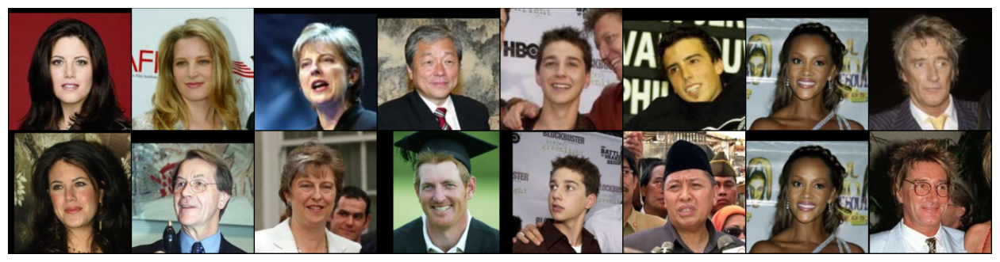

Batch : 3
[-1.  1.  1.  1. -1.  1. -1. -1.]


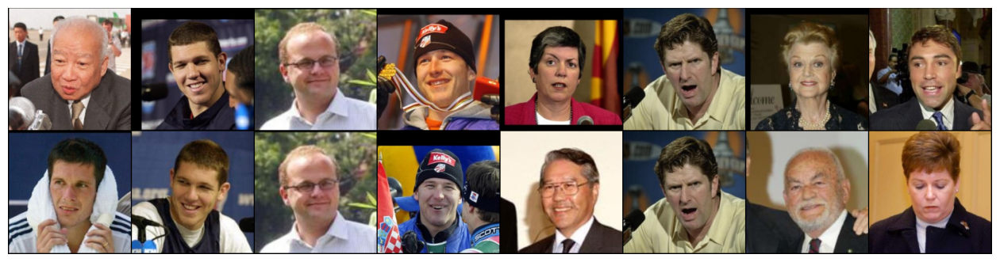

Batch : 4
[ 1. -1. -1.  1.  1.  1.  1.  1.]


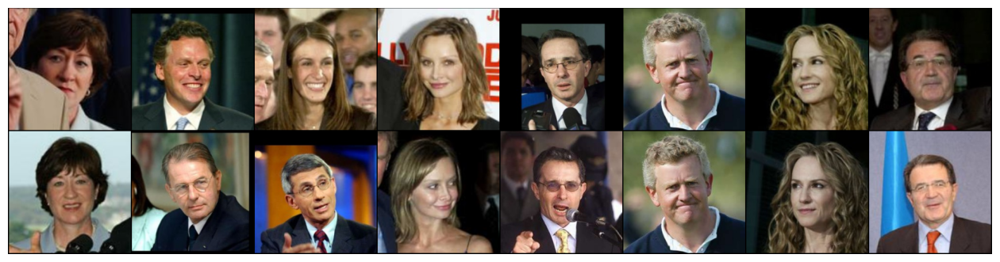

In [9]:
number_of_batches_visualized = 5
for batch in range(number_of_batches_visualized):
  print(f"Batch : {batch}")
  dataiter = iter(visualize_dataloader)
  batch = next(dataiter)
  print(batch[2].numpy().T)
  concatenated = torch.cat((batch[0], batch[1]), 0)
  img = torchvision.utils.make_grid(concatenated)
  npimg = img.numpy()
  plt.figure(figsize = (16, 8))
  plt.axis("off")
  plt.imshow(np.transpose(npimg, (1, 2, 0)))
  plt.show()

Thus we see that our dataset is creating similar and dissimilar pairs of images and also the labels for them correctly. It creates a label of 1 for similar images and -1 for dissimilar images.

## Q4: Selecting a pre trained model trained on ImageNet keeping in mind the tradeoff of computational resources as well as accuracy

- We will be using Pytorch's ResNet-18 which is pre trained on ImageNet for this application

In [10]:
resnet50_model = models.resnet50(weights='ResNet50_Weights.DEFAULT')

## Q5: Appropriately crop and resize the images based on your computational resources
- We reshape our images to 224x224x3 using the transform operation which we defined earlier for the dataset class
- We also choose the batch sizes, dataset sizes for the train, test and validation datasets

In [11]:
train_dataset = SiameseNetworkDataset(personNames=train_data_names, dataset_size=1000, transform=transforms.Compose([
                                      transforms.Resize((224, 224)), transforms.ToTensor()]))
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=48)

valid_dataset = SiameseNetworkDataset(personNames=validation_data_names, dataset_size=100, transform=transforms.Compose([
                                      transforms.Resize((224, 224)), transforms.ToTensor()]))
valid_dataloader = DataLoader(valid_dataset, shuffle=False, batch_size=8)

test_dataset = SiameseNetworkDataset(personNames=test_data_names, dataset_size=100, transform=transforms.Compose([
                                     transforms.Resize((224, 224)), transforms.ToTensor()]))
test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=8)

## Q6: Defining the Siamese Network
- We use the ResNet model as the base model for our Siamese Network
- We drop the softmax layer of the ResNet model and add a fully connected layer with three hidden layers, we also use RELU activation for the hidden layers, the last layer output will not have any activation function and will serve as embedding for the images
- We use transfer learning to train the model, we freeze the weights of the ResNet model and only train the weights of the fully connected layers

In [12]:
class SiameseNetwork(nn.Module):

    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()

        self.base_model = nn.Sequential(*list(base_model.children())[:-1])

        for wt in self.base_model.parameters():
            wt.requires_grad_(False)

        self.fc = nn.Sequential(
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
        )

    def forward_one(self, x):
        x = self.base_model(x)
        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

## Q6:  Metric Learning Scheme (cosine similarity or Euclidean distance, paired with cross-entropy or hinge loss with a margin)
- We use PyTorch's [`CosineEmbeddingLoss`](https://pytorch.org/docs/stable/generated/torch.nn.CosineEmbeddingLoss.html) as our loss function, which internally handles both cosine similarity paired with a hinge with user defined margin as the loss function.

In [13]:
if torch.cuda.is_available():
    model = SiameseNetwork(resnet50_model).cuda()
else:
    model = SiameseNetwork(resnet50_model)
criterion = torch.nn.CosineEmbeddingLoss()
optimizer = optim.Adagrad(model.parameters(), lr=0.01)

## Training the Model
- we track the running training loss, and in order to perform the validation we choose a threshold 0.8 for the cosine similarity, if the cosine similarity is greater than 0.8 we consider the images to be similar, else we consider them to be dissimilar, and thus we track the running validation accuracy

In [14]:
def train_model(model, number_of_epochs, visualize=False):
    threshold = 0.8
    curr_epoch = 0
    counter = []
    train_loss_history = []
    valid_accuracy_history = []
    for epoch in range(number_of_epochs):
        avg_train_loss = 0.0
        for i, data in enumerate(train_dataloader):
            img0, img1, label = data
            optimizer.zero_grad()

            if torch.cuda.is_available():
                output1, output2 = model(img0.cuda(), img1.cuda())
            else:
                output1, output2 = model(img0, img1)

            if torch.cuda.is_available():
                loss = criterion(output1, output2, label.cuda())
            else:
                loss = criterion(output1, output2, label)

            loss.backward()
            optimizer.step()
            avg_train_loss += loss.item()
        avg_train_loss /= len(train_dataloader)

        correct = 0

        for j, vdata in enumerate(valid_dataloader):
            vimg0, vimg1, vlabel = vdata

            if torch.cuda.is_available():
                voutput1, voutput2 = model(vimg0.cuda(), vimg1.cuda())
            else:
                voutput1, voutput2 = model(vimg0, vimg1)

            cosine_similarity = torch.nn.functional.cosine_similarity(
                voutput1, voutput2)
            pred_label = cosine_similarity.cpu().detach().numpy()
            pred_label[pred_label > threshold] = 1.0
            pred_label[pred_label <= threshold] = -1.0
            correct += np.sum(pred_label == vlabel.cpu().detach().numpy())

        accuracy = correct*100/(8*len(valid_dataloader))

        print("Epoch number {} : Training loss {} : Validation Accuracy {}%".format(
            epoch, avg_train_loss, accuracy))
        curr_epoch += 1
        counter.append(curr_epoch)
        train_loss_history.append(avg_train_loss)
        valid_accuracy_history.append(accuracy)
    
    if (visualize):
        plt.plot(counter, train_loss_history)
        plt.xlabel("Epochs")
        plt.ylabel("Training Loss")
        plt.show()
        plt.plot(counter, valid_accuracy_history)
        plt.xlabel("Epochs")
        plt.ylabel("Validation Accuracy")
        plt.show()

## Without Regularization and Image Augmentation

Epoch number 0 : Training loss 0.45956324679510935 : Validation Accuracy 57.69230769230769%
Epoch number 1 : Training loss 0.5065922510056269 : Validation Accuracy 46.15384615384615%
Epoch number 2 : Training loss 0.5014074913093022 : Validation Accuracy 65.38461538461539%
Epoch number 3 : Training loss 0.36641416805131094 : Validation Accuracy 62.5%
Epoch number 4 : Training loss 0.3668075239374524 : Validation Accuracy 65.38461538461539%
Epoch number 5 : Training loss 0.32960201303164166 : Validation Accuracy 73.07692307692308%
Epoch number 6 : Training loss 0.3358651860838845 : Validation Accuracy 69.23076923076923%
Epoch number 7 : Training loss 0.3314509015707743 : Validation Accuracy 69.23076923076923%
Epoch number 8 : Training loss 0.3228123571191515 : Validation Accuracy 68.26923076923077%
Epoch number 9 : Training loss 0.30101672453539713 : Validation Accuracy 70.1923076923077%
Epoch number 10 : Training loss 0.29424866821084705 : Validation Accuracy 71.15384615384616%
Epoch n

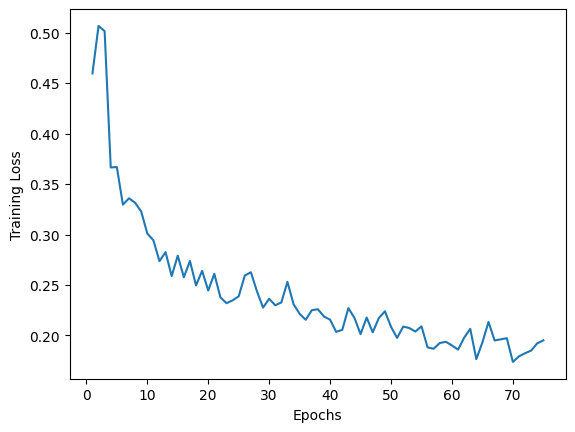

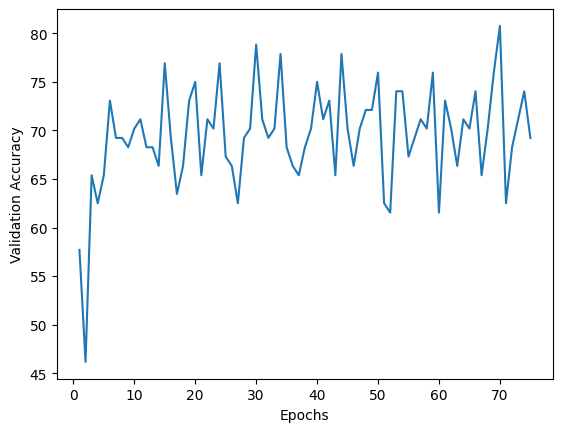

In [15]:
train_model(model, 75, visualize=True)

- We see that the training loss is decreasing and the moving average of our validation accuracy is increasing, thus we can say that our model is learning

In [16]:
torch.save(model, 'epochs75.pt')

In [34]:
model = torch.load('epochs75.pt')

### Cosine Similarity Visualization

[ 0.9552909   0.9432263  -0.11719724  0.85784113  0.6955845  -0.22674724
 -0.10724957  0.41086462]


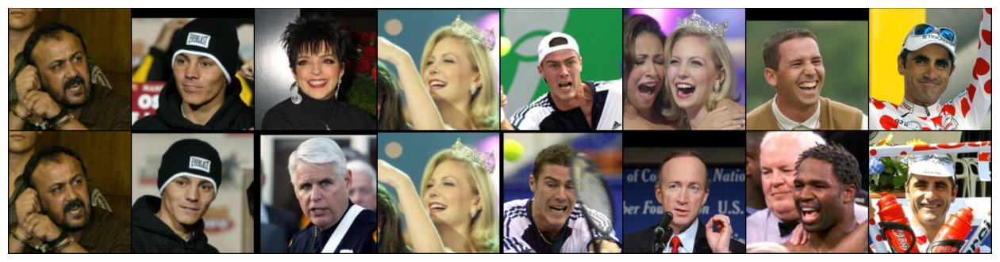

[ 0.68244964 -0.64127374 -0.2758184  -0.27973995 -0.67562544  0.89642334
  0.0920777   0.749592  ]


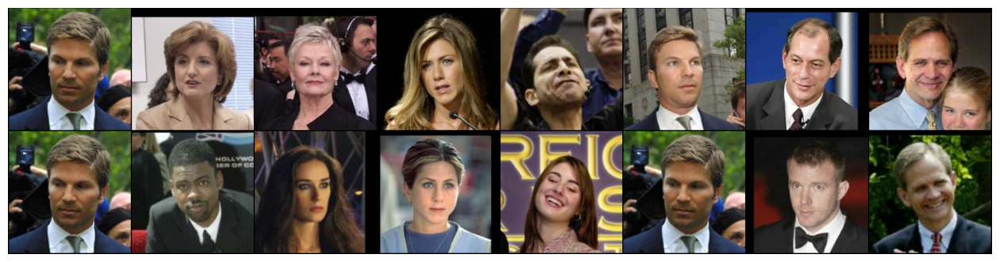

[ 0.753441    0.14499506  0.5340165  -0.56641835  0.1512319   0.7276839
  0.8695984  -0.4302202 ]


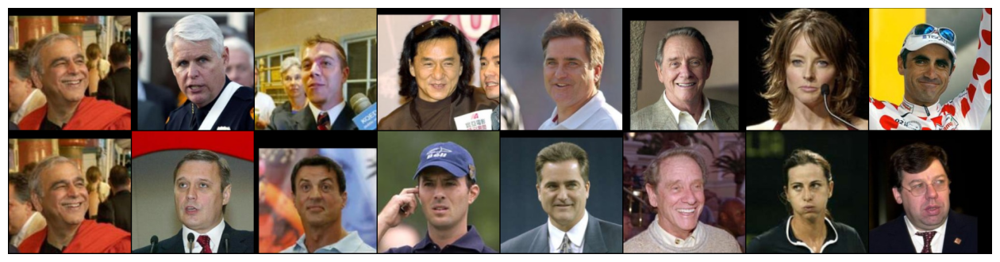

In [36]:
dataiter = iter(test_dataloader)
for i in range(3):
    img0, img1, label = next(dataiter)
    concatenated = torch.cat((img0, img1),0)

    output1, output2 = model(img0.cuda(), img1.cuda())
    cosine_similarity = torch.nn.functional.cosine_similarity(output1, output2)
    print(cosine_similarity.cpu().detach().numpy().T)
    img = torchvision.utils.make_grid(concatenated)
    npimg = img.numpy()
    plt.figure(figsize = (16, 8))
    plt.axis("off")
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

As we can see that the cosine similarities of the embeddings of the similar images are close to 1 and the cosine similarities of the embeddings of the dissimilar images further away from 1 closer to 0 and -1

### Test Accuracy

In [38]:
threshold = 0.8
correct = 0
for i, data in enumerate(test_dataloader):
  img0, img1, label = data

  if torch.cuda.is_available():
    output1, output2 = model(img0.cuda(), img1.cuda())
  else:
    output1, output2 = model(img0, img1)

  cosine_similarity = torch.nn.functional.cosine_similarity(output1, output2)
  pred_label = cosine_similarity.cpu().detach().numpy()
  pred_label[pred_label > threshold] = 1.0
  pred_label[pred_label <= threshold] = -1.0

  correct += np.sum(pred_label == label.cpu().detach().numpy())

print("Accuracy:", correct*100/(8*len(test_dataloader)))

Accuracy: 68.26923076923077


## 6 (a) With Image Augmentation

- One out of random horizontal flip and random rotation of upto 10 degrees, also random color jitter (the brightness, contrast and saturation changed), gaussian blur, horizontal flip is applied at random with a probability of 0.2

- We keep the same model architecture and hyperparameters as before, also optimiser and loss function are kept the same so that we can compare the results

In [19]:
augmentation_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomApply([
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(degrees=10),
        transforms.ColorJitter(brightness=0.05, contrast=0.05,
                           saturation=0.05, hue=0.05),
        transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 0.2)),
    ], p=0.2), transforms.ToTensor()])

In [20]:
train_dataset = SiameseNetworkDataset(personNames=train_data_names, dataset_size=1000, transform=augmentation_transform)
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=48)

valid_dataset = SiameseNetworkDataset(personNames=validation_data_names, dataset_size=100, transform=transforms.Compose([
                                      transforms.Resize((224, 224)), transforms.ToTensor()]))
valid_dataloader = DataLoader(valid_dataset, shuffle=False, batch_size=8)

test_dataset = SiameseNetworkDataset(personNames=test_data_names, dataset_size=100, transform=transforms.Compose([
                                     transforms.Resize((224, 224)), transforms.ToTensor()]))
test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=8)

In [21]:
if torch.cuda.is_available():
    model = SiameseNetwork(resnet50_model).cuda()
else:
    model = SiameseNetwork(resnet50_model)
criterion = torch.nn.CosineEmbeddingLoss()

optimizer = optim.Adagrad(model.parameters(), lr=0.01)

Epoch number 0 : Training loss 0.4671019627934411 : Validation Accuracy 62.5%
Epoch number 1 : Training loss 0.407076297771363 : Validation Accuracy 64.42307692307692%
Epoch number 2 : Training loss 0.37893237812178476 : Validation Accuracy 58.65384615384615%
Epoch number 3 : Training loss 0.3654257555802663 : Validation Accuracy 66.34615384615384%
Epoch number 4 : Training loss 0.32488186799344565 : Validation Accuracy 61.53846153846154%
Epoch number 5 : Training loss 0.30946403103215353 : Validation Accuracy 67.3076923076923%
Epoch number 6 : Training loss 0.3037733698175067 : Validation Accuracy 67.3076923076923%
Epoch number 7 : Training loss 0.3009457013436726 : Validation Accuracy 72.11538461538461%
Epoch number 8 : Training loss 0.2970044066508611 : Validation Accuracy 57.69230769230769%
Epoch number 9 : Training loss 0.2896111685605276 : Validation Accuracy 68.26923076923077%
Epoch number 10 : Training loss 0.28770841870989117 : Validation Accuracy 75.0%
Epoch number 11 : Train

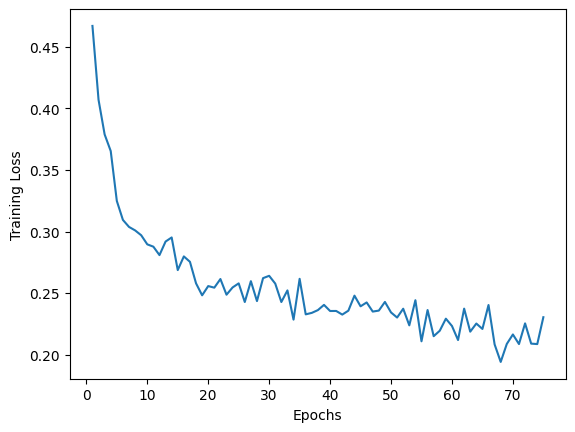

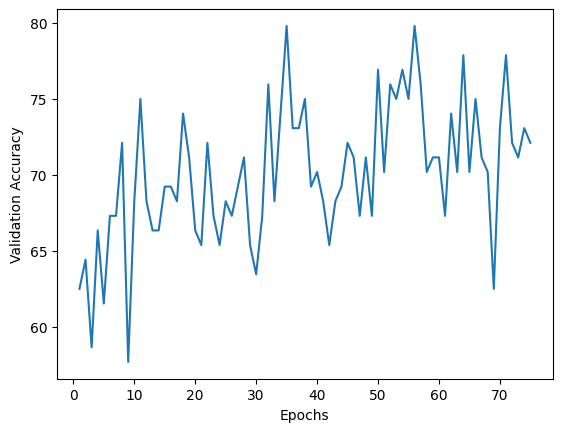

In [22]:
train_model(model, 75, visualize=True)

- We see that the training loss is decreasing and the moving average of our validation accuracy is increasing, thus we can say that our model is learning

In [23]:
torch.save(model, 'epochs75_aug.pt')

In [39]:
model = torch.load('epochs75_aug.pt')

### Cosine Similarity Visualization

[-0.0603061   0.9679591   0.26616132  0.03504582  0.8490968   0.08236748
  0.7935978   0.307389  ]


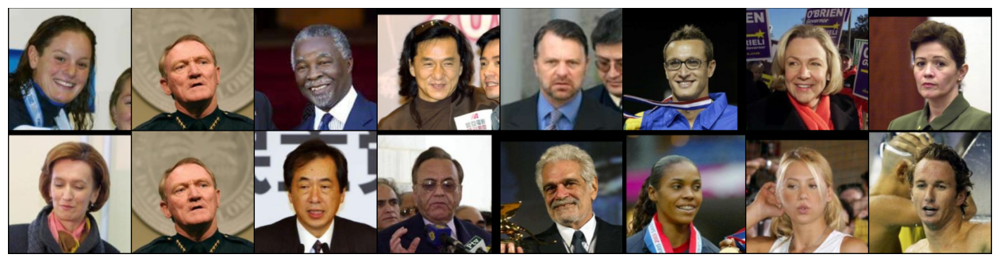

[ 0.94997317  0.40979862  0.7813183  -0.4321487   0.9535634   0.93892485
  0.34428534  0.99658555]


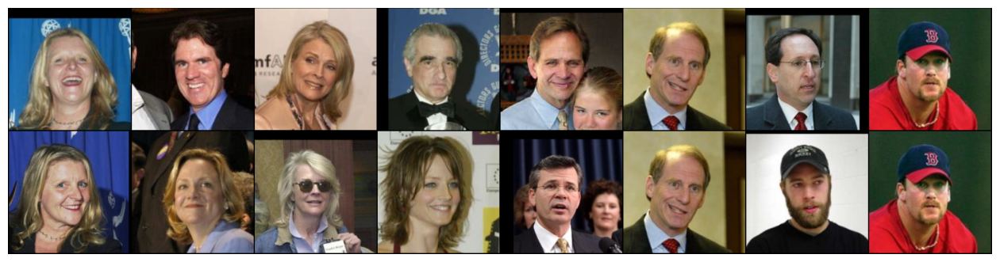

[ 0.65341854 -0.5205158  -0.11123517  0.9824716  -0.4842535   0.38533577
  0.94208527 -0.4145597 ]


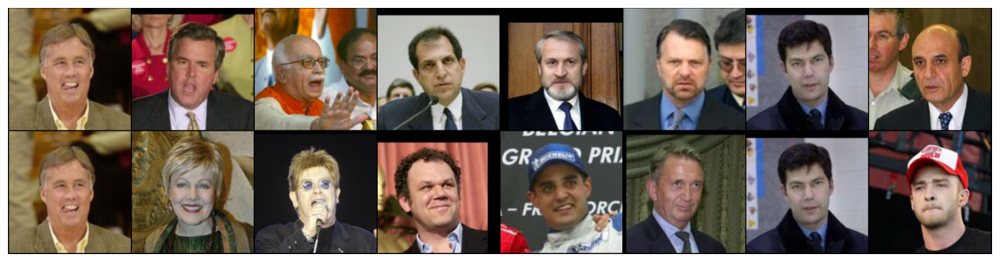

In [44]:
dataiter = iter(test_dataloader)
for i in range(3):
    img0, img1, label = next(dataiter)
    concatenated = torch.cat((img0, img1),0)

    output1, output2 = model(img0.cuda(), img1.cuda())
    cosine_similarity = torch.nn.functional.cosine_similarity(output1, output2)
    print(cosine_similarity.cpu().detach().numpy().T)
    img = torchvision.utils.make_grid(concatenated)
    npimg = img.numpy()
    plt.figure(figsize = (16, 8))
    plt.axis("off")
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

As we can see that the cosine similarities of the embeddings of the similar images are close to 1 and the cosine similarities of the embeddings of the dissimilar images further away from 1 closer to 0 and -1

### Test Accuracy

In [46]:
threshold = 0.8
correct = 0
for i, data in enumerate(test_dataloader):
  img0, img1, label = data

  if torch.cuda.is_available():
    output1, output2 = model(img0.cuda(), img1.cuda())
  else:
    output1, output2 = model(img0, img1)

  cosine_similarity = torch.nn.functional.cosine_similarity(output1, output2)
  pred_label = cosine_similarity.cpu().detach().numpy()
  pred_label[pred_label > threshold] = 1.0
  pred_label[pred_label <= threshold] = -1.0

  correct += np.sum(pred_label == label.cpu().detach().numpy())

print("Accuracy:", correct*100/(8*len(test_dataloader)))

Accuracy: 72.11538461538461


## 6 (a) With Regularization


In [26]:
train_dataset = SiameseNetworkDataset(personNames=train_data_names, dataset_size=1000, transform=transforms.Compose([
                                      transforms.Resize((224, 224)), transforms.ToTensor()]))
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=48)

valid_dataset = SiameseNetworkDataset(personNames=validation_data_names, dataset_size=100, transform=transforms.Compose([
                                      transforms.Resize((224, 224)), transforms.ToTensor()]))
valid_dataloader = DataLoader(valid_dataset, shuffle=False, batch_size=8)

test_dataset = SiameseNetworkDataset(personNames=test_data_names, dataset_size=100, transform=transforms.Compose([
                                     transforms.Resize((224, 224)), transforms.ToTensor()]))
test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=8)

In [27]:
class SiameseNetwork(nn.Module):

    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()

        self.base_model = nn.Sequential(*list(base_model.children())[:-1])

        for wt in self.base_model.parameters():
            wt.requires_grad_(False)

        self.fc = nn.Sequential(
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.15),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.15),
            nn.Linear(256, 128),
        )

    def forward_one(self, x):
        x = self.base_model(x)
        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

In [28]:
if torch.cuda.is_available():
    model = SiameseNetwork(resnet50_model).cuda()
else:
    model = SiameseNetwork(resnet50_model)
criterion = torch.nn.CosineEmbeddingLoss()

optimizer = optim.Adagrad(model.parameters(), lr=0.01, weight_decay=0.0001)

Epoch number 0 : Training loss 0.46101836221558706 : Validation Accuracy 60.57692307692308%
Epoch number 1 : Training loss 0.36974066212063744 : Validation Accuracy 65.38461538461539%
Epoch number 2 : Training loss 0.3329068244922729 : Validation Accuracy 70.1923076923077%
Epoch number 3 : Training loss 0.37196113027277444 : Validation Accuracy 71.15384615384616%
Epoch number 4 : Training loss 0.32186177585806164 : Validation Accuracy 66.34615384615384%
Epoch number 5 : Training loss 0.3178678559405463 : Validation Accuracy 60.57692307692308%
Epoch number 6 : Training loss 0.33385869434901644 : Validation Accuracy 75.96153846153847%
Epoch number 7 : Training loss 0.3026557124796368 : Validation Accuracy 59.61538461538461%
Epoch number 8 : Training loss 0.302745337997164 : Validation Accuracy 75.0%
Epoch number 9 : Training loss 0.28981398046016693 : Validation Accuracy 65.38461538461539%
Epoch number 10 : Training loss 0.27735134462515515 : Validation Accuracy 69.23076923076923%
Epoch 

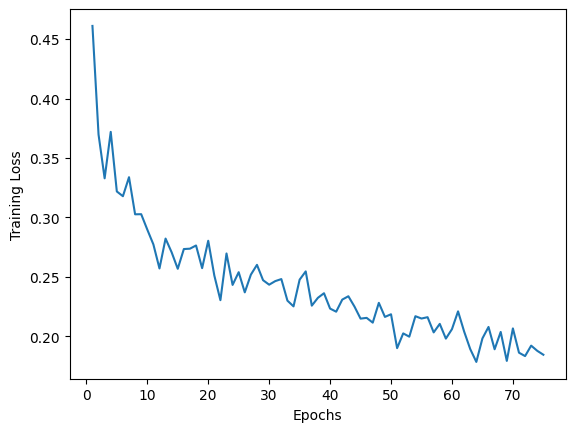

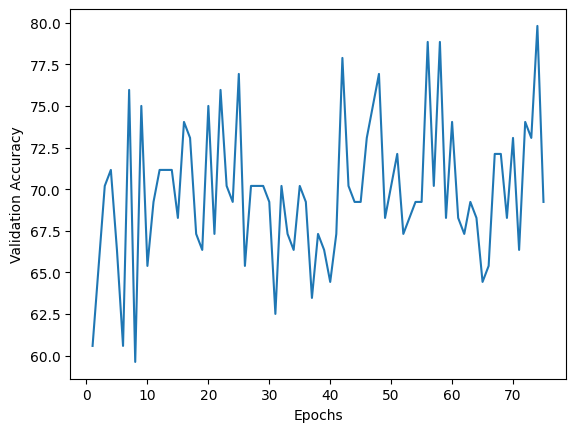

In [29]:
train_model(model, 75, visualize=True)

- We see that the training loss is decreasing and the moving average of our validation accuracy is increasing, thus we can say that our model is learning

In [30]:
torch.save(model, 'epochs75_reg.pt')

In [47]:
model = torch.load('epochs75_reg.pt')

### Cosine Similarity Visualization

[ 0.7664337   0.8256185  -0.09217583 -0.17387567  0.7336332   0.1298965
 -0.14737275 -0.61680436]


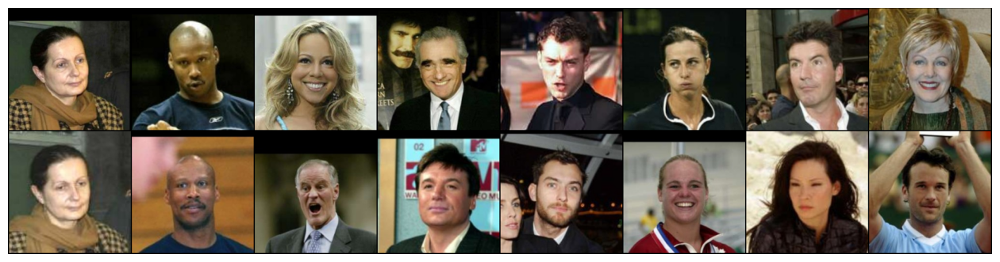

[ 0.89312315  0.6231982  -0.32863793  0.53224146  0.981298    0.9547885
  0.02279401 -0.31691867]


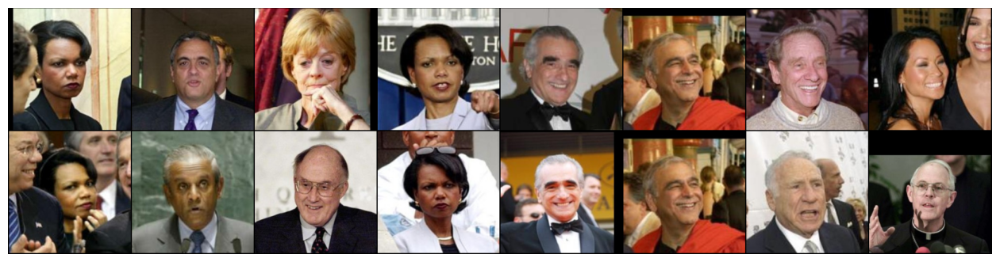

[ 0.7829913   0.29509026 -0.715593    0.6841341   0.9990293  -0.6172961
  0.9783722  -0.42968032]


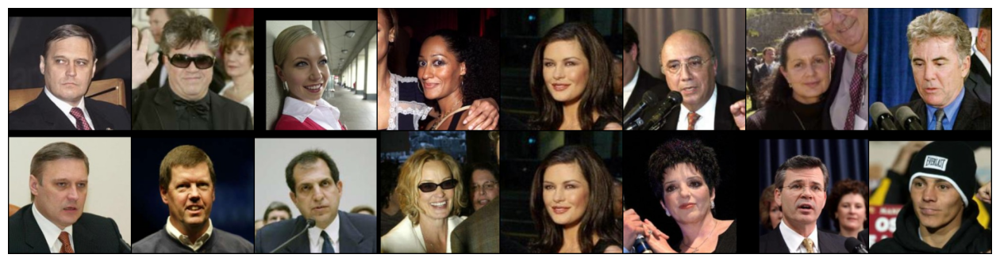

In [55]:
dataiter = iter(test_dataloader)
for i in range(3):
    img0, img1, label = next(dataiter)
    concatenated = torch.cat((img0, img1),0)

    output1, output2 = model(img0.cuda(), img1.cuda())
    cosine_similarity = torch.nn.functional.cosine_similarity(output1, output2)
    print(cosine_similarity.cpu().detach().numpy().T)
    img = torchvision.utils.make_grid(concatenated)
    npimg = img.numpy()
    plt.figure(figsize = (16, 8))
    plt.axis("off")
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

As we can see that the cosine similarities of the embeddings of the similar images are close to 1 and the cosine similarities of the embeddings of the dissimilar images further away from 1 closer to 0 and -1

### Test Accuracy

In [58]:
threshold = 0.8
correct = 0
for i, data in enumerate(test_dataloader):
  img0, img1, label = data

  if torch.cuda.is_available():
    output1, output2 = model(img0.cuda(), img1.cuda())
  else:
    output1, output2 = model(img0, img1)

  cosine_similarity = torch.nn.functional.cosine_similarity(output1, output2)
  pred_label = cosine_similarity.cpu().detach().numpy()
  pred_label[pred_label > threshold] = 1.0
  pred_label[pred_label <= threshold] = -1.0

  correct += np.sum(pred_label == label.cpu().detach().numpy())

print("Accuracy:", correct*100/(8*len(test_dataloader)))

Accuracy: 77.88461538461539
